In [165]:
%load_ext autoreload
%autoreload 2

import cv2
import os

def extract_frames(video_path, output_folder, num_frames=720):
    """
    Extracts a specified number of frames from a video and saves them with numbered filenames.

    Args:
        video_path (str): Path to the input video file.
        output_folder (str): Path to the folder where frames will be saved.
        num_frames (int): Number of frames to extract and save.
    """
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Load the video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Unable to open video file.")
        return

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # Total frames in video
    frame_interval = max(total_frames // num_frames, 1)  # Interval to sample frames

    frame_count = 0
    saved_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret or saved_count >= num_frames:
            break

        # Save every frame_interval-th frame
        if frame_count % frame_interval == 0:
            filename = os.path.join(output_folder, f"{saved_count + 1}.jpg")
            cv2.imwrite(filename, frame)
            saved_count += 1

        frame_count += 1

    cap.release()
    print(f"{saved_count} frames saved to '{output_folder}' folder.")

# Example usage
video_path = "/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/IMG_2591.MOV"  # Replace with the path to your video
output_folder = "/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/hyu-2024-aue8089-pa2/data/iphone"
extract_frames(video_path, output_folder, num_frames=720)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
623 frames saved to '/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/hyu-2024-aue8089-pa2/data/iphone' folder.


In [166]:
import cv2
import numpy as np
import os

# 체커보드 설정
checkerboard_dims = (7, 9)  # 체커보드 코너 개수 (가로, 세로)
square_size = 0.02  # 한 사각형 크기 (단위: m)

# 3D 체커보드 코너 점 정의
objp = np.zeros((checkerboard_dims[0]*checkerboard_dims[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:checkerboard_dims[0], 0:checkerboard_dims[1]].T.reshape(-1, 2) * square_size

# 3D와 2D 점을 저장할 리스트
objpoints = []  # 월드 좌표계 3D 점
imgpoints = []  # 이미지 좌표계 2D 점

# 이미지가 저장된 폴더 경로
image_folder = "/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/hyu-2024-aue8089-pa2/data/iphone"
output_folder = "/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/hyu-2024-aue8089-pa2/data/iphone_intrinsic"  # 결과 저장 폴더
os.makedirs(output_folder, exist_ok=True)  # 결과 저장 폴더 생성

# 폴더 내 이미지 파일 읽어오기
image_paths = [os.path.join(image_folder, fname) for fname in os.listdir(image_folder) if fname.endswith(('.png', '.jpg', '.jpeg'))]
image_paths.sort(key=lambda x: int(''.join(filter(str.isdigit, os.path.basename(x)))))  # 숫자 기준 정렬

previous_number = None


for idx, path in enumerate(image_paths):
    filename = os.path.basename(path)
    print(f"Processing file: {filename}")
    
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 체커보드 코너 탐지
    ret, corners = cv2.findChessboardCorners(gray, checkerboard_dims, None)
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        # 코너를 이미지에 그리기
        cv2.drawChessboardCorners(img, checkerboard_dims, corners, ret)
    if not ret:
        print(f"Failed to detect corners in file: {filename}")
        os.remove(path)
        continue

# 카메라 보정
ret, K, D, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# 내부 행렬, 왜곡 계수 저장
np.savetxt(os.path.join(output_folder, "K.txt"), K, fmt='%.6f')
np.savetxt(os.path.join(output_folder, "D.txt"), D, fmt='%.6f')


def rotation_matrix_to_rpy(R):
    """
    Converts a rotation matrix to Roll, Pitch, Yaw (RPY).

    Args:
        R: 3x3 rotation matrix

    Returns:
        roll, pitch, yaw: Rotation angles in radians
    """
    roll = np.arctan2(R[2, 1], R[2, 2])  # Roll (phi)
    pitch = np.arcsin(-R[2, 0])          # Pitch (theta)
    yaw = np.arctan2(R[1, 0], R[0, 0])   # Yaw (psi)
    return roll, pitch, yaw

# 포즈 저장 (6개의 열로 변환)
poses_6d = []
for rvec, tvec in zip(rvecs, tvecs):
    R, _ = cv2.Rodrigues(rvec)  # 회전 벡터를 회전 행렬로 변환
    roll, pitch, yaw = rotation_matrix_to_rpy(R)  # Roll, Pitch, Yaw 계산
    tx, ty, tz = tvec.flatten()  # 변환 벡터
    poses_6d.append([roll, pitch, yaw, tx, ty, tz])

# 6열 포즈 배열 저장
poses_6d_array = np.array(poses_6d)
np.savetxt(os.path.join(output_folder, "poses_6d.txt"), poses_6d_array, fmt="%.6f", header="roll pitch yaw tx ty tz")



# 결과 출력
print("내부 행렬 (K)와 왜곡 계수 (D)가 저장되었습니다.")
print(f"내부 행렬 (K):\n{K}")
print(f"왜곡 계수 (D):\n{D}")
print("6열 포즈 데이터가 저장되었습니다.")

Processing file: 1.jpg
Processing file: 2.jpg
Processing file: 3.jpg
Processing file: 4.jpg
Processing file: 5.jpg
Processing file: 6.jpg
Processing file: 7.jpg
Processing file: 8.jpg
Processing file: 9.jpg
Processing file: 10.jpg
Processing file: 11.jpg
Processing file: 12.jpg
Processing file: 13.jpg
Processing file: 14.jpg
Processing file: 15.jpg
Processing file: 16.jpg
Processing file: 17.jpg
Processing file: 18.jpg
Processing file: 19.jpg
Processing file: 20.jpg
Processing file: 21.jpg
Processing file: 22.jpg
Processing file: 23.jpg
Processing file: 24.jpg
Processing file: 25.jpg
Processing file: 26.jpg
Processing file: 27.jpg
Processing file: 28.jpg
Processing file: 29.jpg
Processing file: 30.jpg
Processing file: 31.jpg
Processing file: 32.jpg
Processing file: 33.jpg
Processing file: 34.jpg
Processing file: 35.jpg
Processing file: 36.jpg
Processing file: 37.jpg
Processing file: 38.jpg
Processing file: 39.jpg
Processing file: 40.jpg
Processing file: 41.jpg
Processing file: 42.jpg
P

In [167]:
import cv2
import numpy as np

from pose_vector_to_transformation_matrix import pose_vector_to_transformation_matrix
from project_points import project_points
from undistort_image import undistort_image

In [168]:
# load camera poses
pose_vectors = np.loadtxt('data/iphone_intrinsic/poses_6d.txt')

# load camera intrinsics
K = np.loadtxt('data/iphone_intrinsic/K.txt')  # calibration matrix[3x3]
D = np.loadtxt('data/iphone_intrinsic/D.txt')  # distortion coefficients[2x1]

In [169]:
# calculate the cube points to then draw the image
offset_x = 0.02 * 3
offset_y = 0.02
s = 2 * 0.02

X, Y, Z = np.meshgrid(np.arange(2), np.arange(2), np.arange(-1, 1))
p_W_cube = np.stack([
    offset_x + X.flatten() * s,
    offset_y + Y.flatten() * s,
    Z.flatten() * s,
    np.ones([8])], axis=-1)
p_W_cube = p_W_cube.reshape(8, 1, 4)

vertex_id = (
    0, 2, 6, 4, # base layer of the cube
    1, 3, 7, 5, # top layer of the cube
)

lines_id = (
    [0, 1], [2, 3], [4, 5], [6, 7], # vertical lines
    [0, 2], [2, 6], [6, 4], [4, 0], # base lines
    [1, 3], [3, 7], [7, 5], [5, 1], # top lines
)

# set points in world coordinate
num_pts_per_line = 40
weights = np.linspace(0, 1, num_pts_per_line)[..., None]
p_W_cube_all = np.zeros((num_pts_per_line * 12, 4))
for ii, line in enumerate(lines_id):
    indices = slice(ii * num_pts_per_line, (ii + 1) * num_pts_per_line)
    p_W_cube_all[indices] = (weights * p_W_cube[line[0]] + (1 - weights) * p_W_cube[line[1]]).reshape(-1, 4)


  0%|          | 0/45 [00:00<?, ?it/s]

0
[[530 548]
 [531 552]
 [532 547]
 [532 556]
 [533 547]
 [533 561]
 [534 546]
 [534 565]
 [535 569]
 [536 545]
 [537 547]
 [537 573]
 [538 543]
 [538 578]
 [539 582]
 [540 542]
 [540 546]
 [540 586]
 [541 590]
 [542 541]
 [542 595]
 [543 599]
 [544 540]
 [544 545]
 [544 603]
 [546 539]
 [546 607]
 [547 611]
 [548 538]
 [548 545]
 [548 616]
 [549 620]
 [550 536]
 [550 624]
 [551 544]
 [551 628]
 [552 633]
 [553 535]
 [554 637]
 [555 534]
 [555 543]
 [555 641]
 [556 645]
 [557 533]
 [557 649]
 [558 543]
 [558 654]
 [559 532]
 [559 658]
 [560 662]
 [561 530]
 [561 666]
 [562 542]
 [563 529]
 [563 670]
 [564 675]
 [565 528]
 [565 541]
 [565 679]
 [566 683]
 [567 687]
 [568 527]
 [568 691]
 [569 541]
 [569 695]
 [570 526]
 [570 700]
 [572 524]
 [572 540]
 [572 704]
 [573 708]
 [574 523]
 [574 712]
 [576 539]
 [576 711]
 [577 522]
 [577 711]
 [578 711]
 [579 521]
 [579 539]
 [580 710]
 [581 519]
 [581 710]
 [582 709]
 [583 518]
 [583 538]
 [584 708]
 [584 710]
 [586 517]
 [586 537]
 [587 70

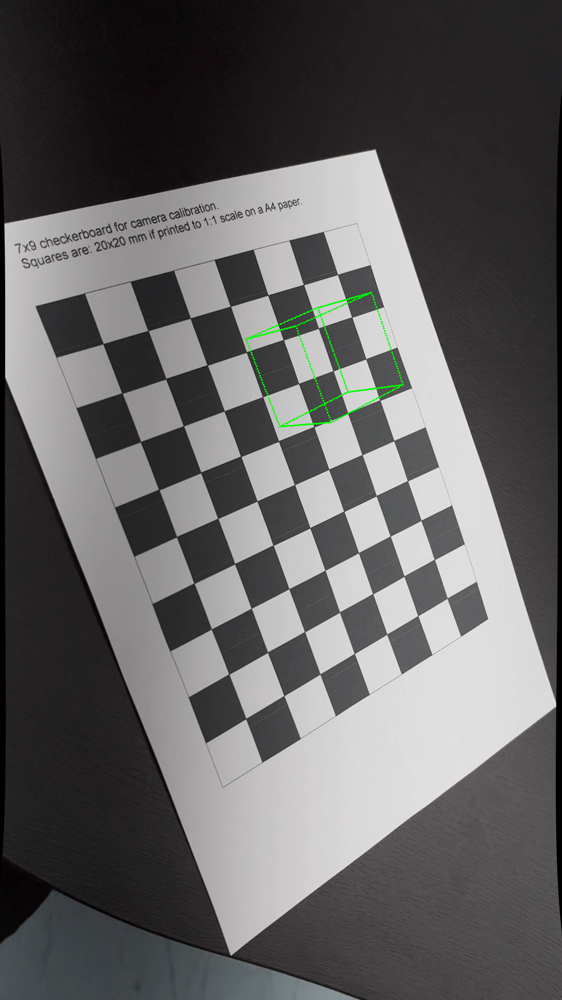

In [178]:
# from tqdm.notebook import tqdm
# from PIL import Image
# import matplotlib.pyplot as plt


# images = []

# for ii in tqdm(range(416)):
#     print(ii)
#     img_index = ii + 1
#     img = cv2.imread(f'data/iphone/{img_index}.jpg')    
#     # 왜곡 보정
#     debug_image_path1 = os.path.join("/Users/dain/Library/Mobile Documents/com~apple~CloudDocs/HANYANG/1_2/3Dvision_PA/hyu-2024-aue8089-pa2/data/iphone_intrinsic", f"first_{idx+1}.jpg")
#     cv2.imwrite(debug_image_path1, img)
#     img_undistorted = cv2.undistort(img, K, D)

#     print(pose_vectors)
#     print(pose_vectors.shape)
#     # 현재 프레임의 카메라 변환 행렬
#     T_C_W = pose_vector_to_transformation_matrix(pose_vectors[ii])

#     # 구의 점을 카메라 좌표계로 변환
#     p_C_sphere = (T_C_W @ p_W_sphere.T).T
#     p_C_sphere = p_C_sphere[:, :3]  # x, y, z만 추출

#     # 이미지 좌표로 투영
#     sphere_pts = project_points(p_C_sphere, K, np.zeros([4, 1]))
#     sphere_pts_int = sphere_pts.astype(int)

#     # 구 점 그리기 (파란색)
#     for x, y in sphere_pts_int:
#         if 0 <= y < img_undistorted.shape[0] and 0 <= x < img_undistorted.shape[1]:
#             img_undistorted[y, x] = (0, 0, 255)
#      # 선 그리기: 위도와 경도에 따른 선 연결

#     # 위도 선 그리기
#     for i in range(num_theta):
#         for j in range(num_phi - 1):
#             pt1 = sphere_pts_int[i * num_phi + j]
#             pt2 = sphere_pts_int[i * num_phi + (j + 1)]
#             if all(0 <= pt1) and all(pt1 < [img_undistorted.shape[1], img_undistorted.shape[0]]) and \
#                all(0 <= pt2) and all(pt2 < [img_undistorted.shape[1], img_undistorted.shape[0]]):
#                 cv2.line(img_undistorted, tuple(pt1), tuple(pt2), (0, 0, 255), 1, cv2.LINE_AA)

#     # 경도 선 그리기
#     for j in range(num_phi):
#         for i in range(num_theta - 1):
#             pt1 = sphere_pts_int[i * num_phi + j]
#             pt2 = sphere_pts_int[(i + 1) * num_phi + j]
#             if all(0 <= pt1) and all(pt1 < [img_undistorted.shape[1], img_undistorted.shape[0]]) and \
#                all(0 <= pt2) and all(pt2 < [img_undistorted.shape[1], img_undistorted.shape[0]]):
#                 cv2.line(img_undistorted, tuple(pt1), tuple(pt2), (0, 0, 255), 1, cv2.LINE_AA)


#     images.append(img_undistorted)

# # 마지막 프레임 확인
# Image.fromarray(images[-1])

from tqdm.notebook import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

images = []

N = len(pose_vectors)

for ii in tqdm(range(N)):
    print(ii)
    img_index = ii + 1    
    img_path = f'data/iphone/{img_index}.jpg'
    
    # 파일 존재 여부 확인
    if not os.path.exists(img_path):
        print(f"Image {img_path} not found. Skipping...")
        continue
    
    # 이미지 읽기
    img = cv2.imread(img_path)

    img_undistorted = cv2.undistort(img, K, D)
    
    T_C_W = pose_vector_to_transformation_matrix(pose_vectors[ii])

    # project on image coordinate
    p_C_cube = np.matmul(T_C_W[None, :, :], p_W_cube_all[:, :, None]).squeeze(-1)
    p_C_cube = p_C_cube[:, :3]

    cube_pts = project_points(p_C_cube, K, np.zeros([4, 1]))
    cube_pts_int = cube_pts.astype(int)
    cube_pts_int = np.unique(cube_pts_int, axis=0)
    print(cube_pts_int)


    # draw points
    for x, y in cube_pts_int:
        for iy in range(-1, 2):
            for ix in range(-1, 2):
                img_undistorted[y+iy, x+ix] = (0, 255, 0)

    images.append(img_undistortged)

Image.fromarray(images[-1])

In [171]:
import warnings

# Save to video file
fps = 20
height, width, _ = images[10].shape
fourcc = cv2.VideoWriter_fourcc(*'MJPG')
video_filename = 'ar_wireframe_cube.avi'
video_writer = cv2.VideoWriter(video_filename, fourcc, fps, (width, height))


with warnings.catch_warnings(record=True):
    for image in tqdm(images):
        video_writer.write(image)

video_writer.release()

  0%|          | 0/603 [00:00<?, ?it/s]

In [172]:
from matplotlib import animation
from IPython.display import display, HTML

import matplotlib.pyplot as plt

def plot_sequence_images(image_array):
    ''' Display images sequence as an animation in jupyter notebook

    Args:
        image_array(numpy.ndarray): image_array.shape equal to (num_images, height, width, num_channels)
    '''
    dpi = 72.0
    xpixels, ypixels = image_array[0].shape[:2]
    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    im = plt.figimage(image_array[0])

    def animate(i):
        im.set_array(image_array[i])
        return (im,)

    anim = animation.FuncAnimation(fig, animate, frames=len(image_array), interval=33, repeat_delay=1, repeat=True)
    display(HTML(anim.to_html5_video()))

In [173]:
plot_sequence_images(np.array(images))

<Figure size 1080x1920 with 0 Axes>